## Visión por Computadora II
### Carrera de Especialización en Inteligencia Artificial - FIUBA

## Trabajo Práctico Final

### 2º Bimestre 2025

### Grupo

| Autores               | E-mail                    | Nº SIU  |
|---------------------- |---------------------------|---------|
| Braian Desía          | b.desia@hotmail.com       | a1804   |
| Lautaro Medina        | medinalautarog@gmail.com  | a1813   |

# **PLANT DISEASE DETECTION**

El objetivo de este trabajo es construir una red neuronal convolucional (CNN) utilizando Pytorch, capaz de clasificar cuando una planta está enferma o no.

El dataset se encuentra en este link: https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset

### 0. LIBRERÍAS GENERALES

In [1]:
# For data manipulation
import numpy as np
import pandas as pd

# For path manipulation
import os # 

# For visualization
import matplotlib.pyplot as plt

import torch

### 1. EXPLORATORY DATA ANALYSIS

#### 1.1 PRELIMINAR

El dataset presenta 3 carpetas:
- color
- grayscale
- segmented

Esas carpetas tienen, a su vez, subcarpetas con las categorías.

Comparamos la cantidad de archivos en las 3 carpetas, por categoría.

In [2]:
base_dir = './plantvillage dataset/'

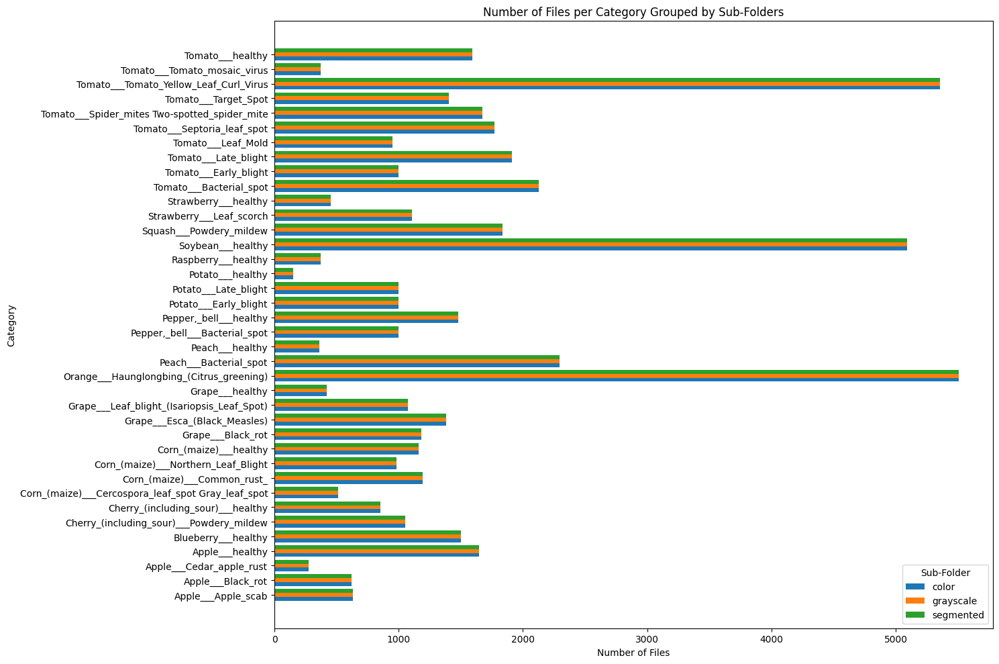

In [3]:
# List sub-folders in the main directory
subfolders = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# Initialize dictionary to store data: {sub_subfolder: [file counts per subfolder]}
data = {}

# Iterate over each subfolder
for subc in subfolders:
    subc_path = os.path.join(base_dir, subc)
    # List sub-sub-folders
    sub_subs = [d for d in os.listdir(subc_path) if os.path.isdir(os.path.join(subc_path, d))]
    for sub_sub in sub_subs:
        sub_sub_path = os.path.join(subc_path, sub_sub)
        # Count files in each sub-sub-folder
        files = [f for f in os.listdir(sub_sub_path) if os.path.isfile(os.path.join(sub_sub_path, f))]
        if sub_sub not in data:
            data[sub_sub] = []
        data[sub_sub].append(len(files))

# Sort the sub-sub-folders
sub_subs_sorted = sorted(data.keys())

# Number of groups and bars
num_groups = len(sub_subs_sorted)
num_bars = len(subfolders)

# Create the figure with more height for horizontal bars
fig, ax = plt.subplots(figsize=(15, 10))

# Bar height
total_width = 0.8
bar_height = total_width / num_bars

# Positions on the y-axis
indices = np.arange(num_groups)

# Create horizontal bars
for i, subc in enumerate(subfolders):
    # Get data sorted according to sub_subs_sorted
    values = [data[sub_sub][i] if i < len(data[sub_sub]) else 0 for sub_sub in sub_subs_sorted]
    # Y-position for this set of bars
    pos = indices - total_width/2 + i * bar_height + bar_height/2
    ax.barh(pos, values, height=bar_height, label=subc)

# Configure labels and legend
ax.set_ylabel('Category')
ax.set_xlabel('Number of Files')
ax.set_title('Number of Files per Category Grouped by Sub-Folders')
ax.set_yticks(indices)
ax.set_yticklabels(sub_subs_sorted)
ax.legend(title='Sub-Folder')

plt.tight_layout()
plt.show()

In [4]:
# List to store the names of classes with discrepancies
discrepant_classes = []

# Check if each sub-sub-folder has the same number of files across all sub-folders
all_match = True

for sub_sub in sub_subs_sorted:
    file_counts = data[sub_sub]
    # Verify if all counts are the same
    if len(set(file_counts)) != 1:
        print(f"Mismatch found in class: {sub_sub}")
        discrepant_classes.append(sub_sub)  # Save class with discrepancy
        all_match = False

if all_match:
    print("For each class, all sub-folders have the same number of files.")

Mismatch found in class: Grape___Esca_(Black_Measles)


In [5]:
# Veamos para la clase con la diferencia encontrada
data [discrepant_classes[0]]

[1383, 1383, 1384]

Vemos cual es el archivo que esta de más:

In [6]:
def dataset_folderpath(dataset_name):
    return base_dir + dataset_name + '/'

# List files in each folder
files_folder1 = set(os.listdir(dataset_folderpath('color/' + discrepant_classes[0])))
files_folder2 = set(os.listdir(dataset_folderpath('segmented/' + discrepant_classes[0])))

# Create a set for filenames without extension or suffix
mask_suffix = '_final_masked'

files_folder2_without_mask = set()

for filename in files_folder2:
    # Remove the extension
    base_name, ext = os.path.splitext(filename)
    # Remove the suffix
    base_name = base_name[:-len(mask_suffix)]
    files_folder2_without_mask.add(base_name)

files_folder1_names = set()
for filename in files_folder1:
    name, ext = os.path.splitext(filename)
    files_folder1_names.add(name)

# Count matches
matches = files_folder1_names.intersection(files_folder2_without_mask)
non_matches = files_folder1_names.symmetric_difference(files_folder2_without_mask)

print(f"Number of files with the same name: {len(matches)}")
print(f"Number of files without a match: {len(non_matches)}")
print('')

non_matching_files = [filename for filename in non_matches]
print("Files in folder2 with no corresponding match in folder1:")
for filename in non_matches:
    print(filename)

Number of files with the same name: 1383
Number of files without a match: 1

Files in folder2 with no corresponding match in folder1:
7e1fd9b9-1fd9-4f98-93f5-8cf9ebc60dd9___FAM_B.Msls 4430


**OBSERVACIONES:**

- Con excepción de la clase "Grape__Esca_(Black_Measles)", se infiere que cada sub-carpeta, presenta los mismos casos por clase pero diferenciandose en que las imagenes están a color, en escala de grises y segmentadas, respectivamente.

- Para la clase "Grape__Esca_(Black_Measles)", la sub-carpeta "segmented" presenta 1 archivo más respecto de las otras 2 carpetas.

#### 1.1 DATA ANALYSIS

Cargamos los datasets:

In [7]:
from torchvision import datasets

# Cargar los diferentes datasets
dataset_color = datasets.ImageFolder(root = dataset_folderpath('color'))
dataset_gray = datasets.ImageFolder(root = dataset_folderpath('grayscale'))
dataset_seg = datasets.ImageFolder(root = dataset_folderpath('segmented'))

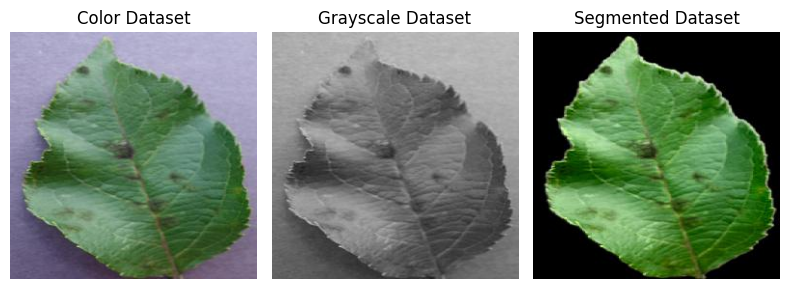

In [8]:
# Function to display a list of images in a row
def show_images_in_row(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(8, 5))
    if len(images) == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Sample one image from each dataset
images = []
titles = ['Color Dataset', 'Grayscale Dataset', 'Segmented Dataset']
samples = [
    dataset_color,
    dataset_gray,
    dataset_seg
]

for dataset in samples:
    image, label = dataset[0]
    images.append(image)

# Show all three images in a row
show_images_in_row(images, titles)



**OBSERVACIONES:**

- Se asume a la carpeta "color" como la original sin procesamiento, siendo "grayscale" y "segmented" versiones procesadas de esta carpeta.

- Dado que nuestro interes está en analizar la hoja en si y su fondo no aporta valor alguno, utilizar el conjunto con la imagen segmentada resulta atractivo.

Veamos el tamaño de las imágenes del dataset:

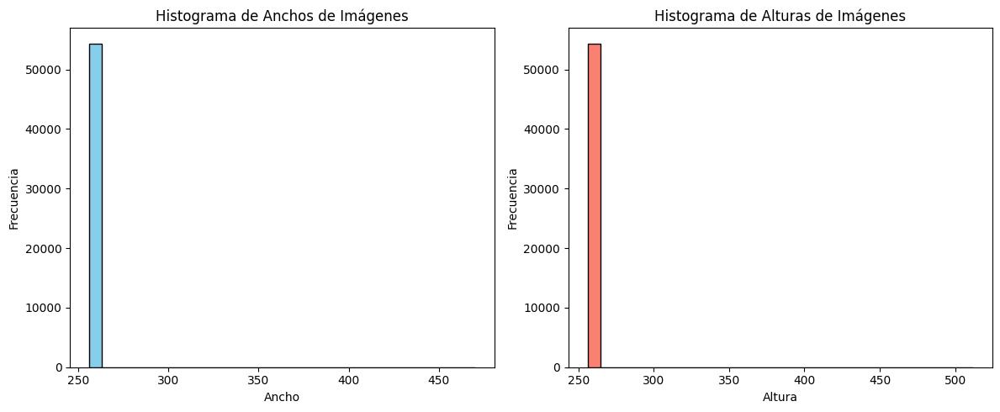

Ancho mínimo: 256, Ancho máximo: 470
Altura mínima: 256, Altura máxima: 512


In [9]:
# Variables para almacenar dimensiones
widths = []
heights = []

# Inicializar las alturas y anchuras
min_height = float('inf')
max_height = float('-inf')
min_width = float('inf')
max_width = float('-inf')

# Iterar sobre el conjunto de datos para recolectar dimensiones
for img, label in dataset:
    width, height = img.size
    widths.append(width)
    heights.append(height)

min_width = min(widths)
max_width = max(widths)
min_height = min(heights)
max_height = max(heights)

# Graficar histograma de anchos
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='skyblue', edgecolor='black')
plt.title('Histograma de Anchos de Imágenes')
plt.xlabel('Ancho')
plt.ylabel('Frecuencia')

# Graficar histograma de alturas
plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='salmon', edgecolor='black')
plt.title('Histograma de Alturas de Imágenes')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

print(f"Ancho mínimo: {min_width}, Ancho máximo: {max_width}")
print(f"Altura mínima: {min_height}, Altura máxima: {max_height}")

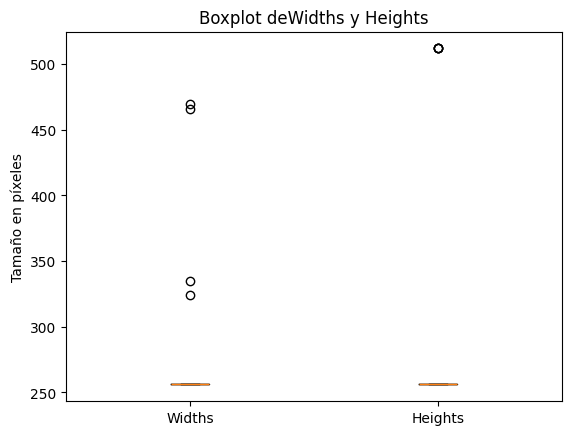

In [10]:
plt.boxplot([widths, heights], labels=['Widths', 'Heights'])
plt.ylabel('Tamaño en píxeles')
plt.title('Boxplot deWidths y Heights')
plt.show()

In [11]:
avg_width = sum(widths) / len(widths)
avg_height = sum(heights) / len(heights)

print(f"Ancho promedio: {avg_width}")
print(f"Altura promedio: {avg_height}")

Ancho promedio: 256.010514491953
Altura promedio: 256.0188561116635


**OBSERVACIONES:**

- Vemos que prácticamente todas las imagenes tiene 256x256 de tamaño, con excepción de unos pocos outliers.

- La relación de aspecto es 1 el prácticamente la mayoría de las imágenes.

- Para el procesamiento, aplicaremos un transform para igualar el tamaño de todas las imágenes o podríamos directamente eliminar los outliers sin mayor perjucio.

In [12]:
nclasses = len(dataset_color.classes)
class_names = dataset_color.classes

print("La cantidad de clases es: ", nclasses)
print("Las clases son: ", class_names)
print("Índice a Clase: ", dataset_color.class_to_idx)

La cantidad de clases es:  38
Las clases son:  ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mite

**OBSERVACIONES:**

- Las clases tienen la siguiente nomenclatura {PLANTA} + ___ + {CONDICIÓN}

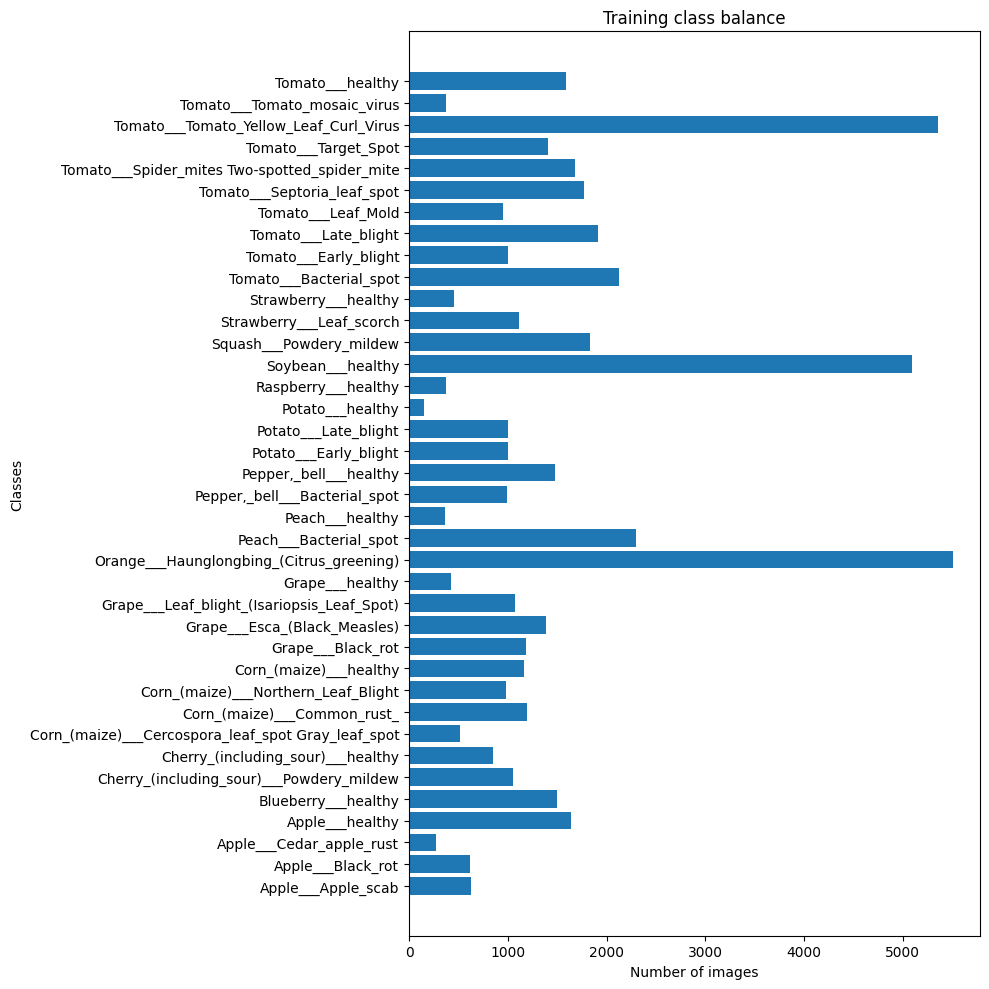

In [13]:
from collections import Counter

# Count the classes in the training set
class_names = dataset_color.classes
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Get class names and their counts
classes = [class_names[i] for i in range(len(class_names))]
counts = [class_counts[i] for i in range(len(class_names))]

# Create the horizontal bar chart
plt.figure(figsize=(10, 10))
plt.barh(classes, counts)
plt.title('Training class balance')
plt.xlabel('Number of images')
plt.ylabel('Classes')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Vemos que hay un desbalance notorio de clases.

Sampleamos algunas imagenes por clase

Apple___Apple_scab


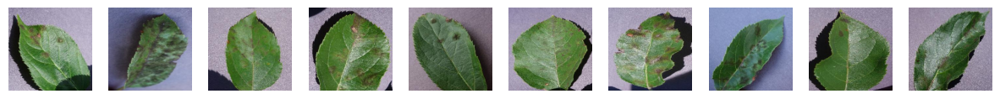

Apple___Black_rot


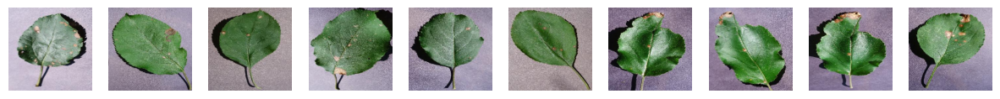

Apple___Cedar_apple_rust


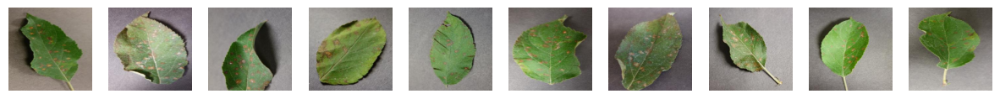

Apple___healthy


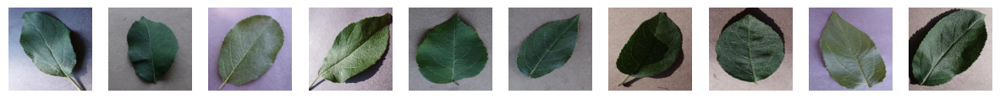

Blueberry___healthy


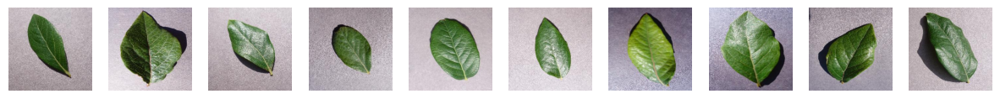

Cherry_(including_sour)___Powdery_mildew


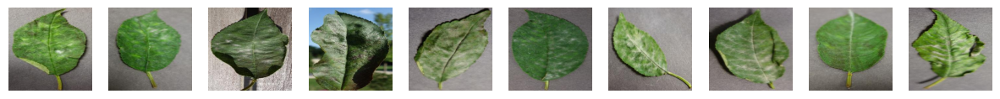

Cherry_(including_sour)___healthy


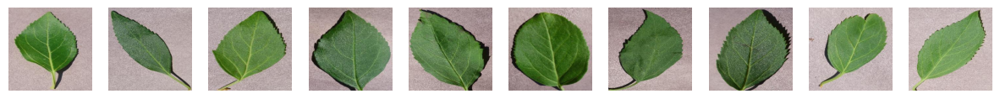

Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot


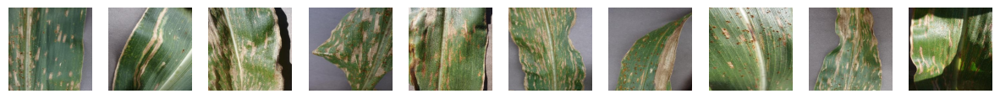

Corn_(maize)___Common_rust_


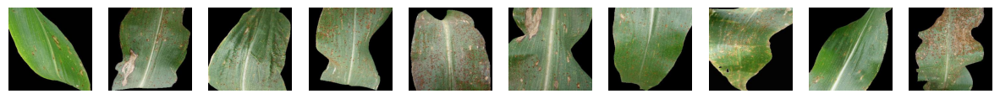

Corn_(maize)___Northern_Leaf_Blight


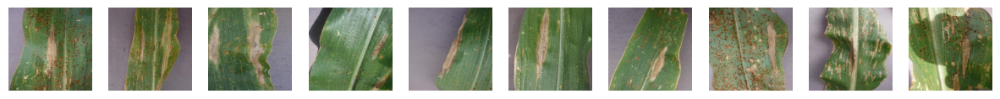

Corn_(maize)___healthy


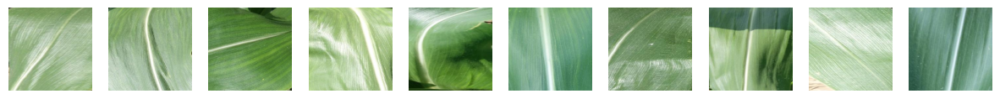

Grape___Black_rot


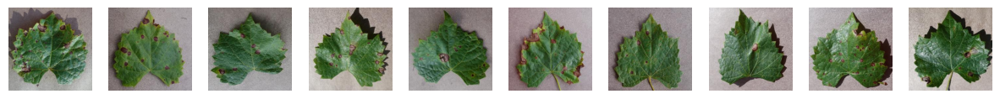

Grape___Esca_(Black_Measles)


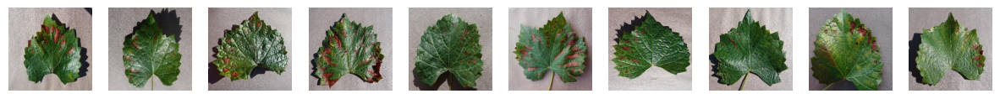

Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


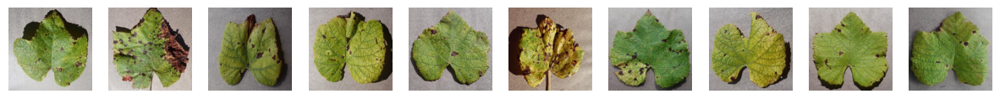

Grape___healthy


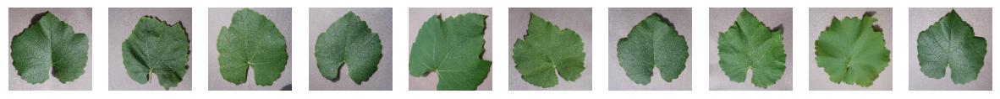

Orange___Haunglongbing_(Citrus_greening)


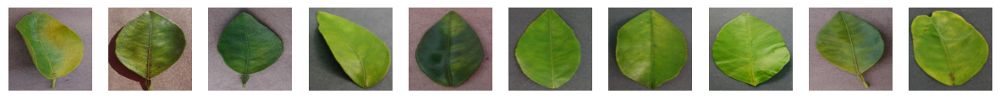

Peach___Bacterial_spot


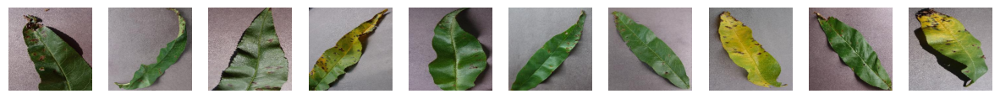

Peach___healthy


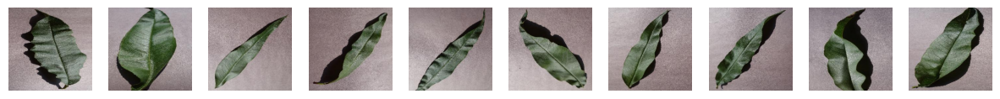

Pepper,_bell___Bacterial_spot


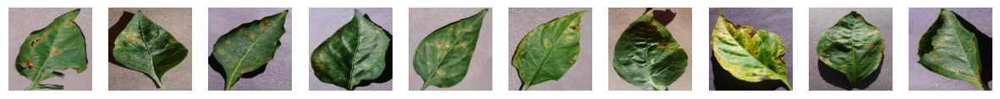

Pepper,_bell___healthy


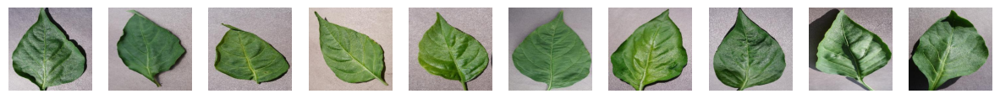

Potato___Early_blight


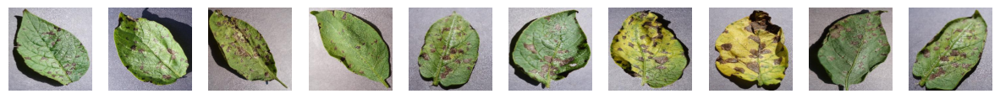

Potato___Late_blight


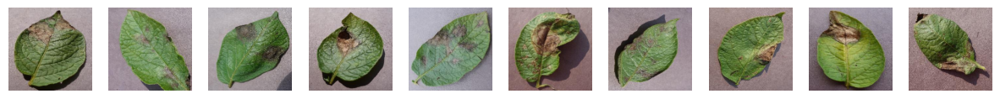

Potato___healthy


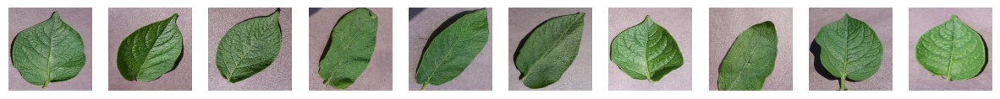

Raspberry___healthy


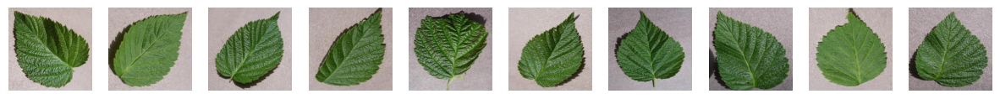

Soybean___healthy


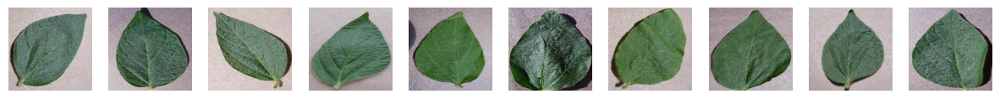

Squash___Powdery_mildew


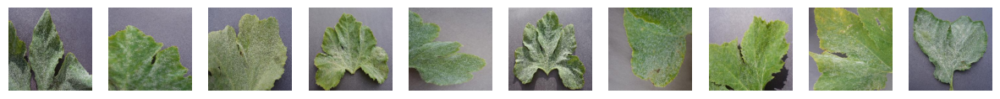

Strawberry___Leaf_scorch


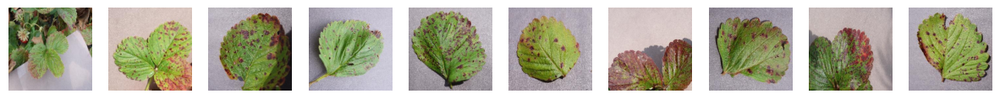

Strawberry___healthy


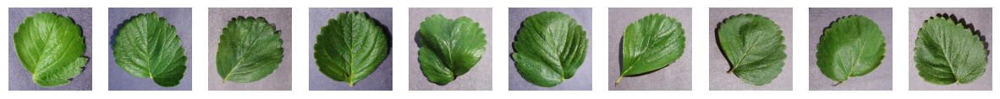

Tomato___Bacterial_spot


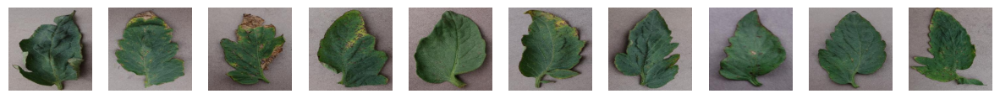

Tomato___Early_blight


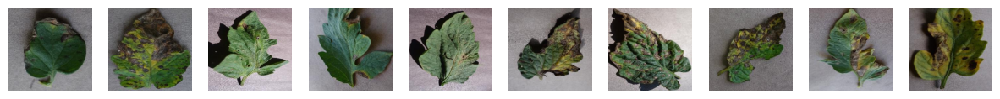

Tomato___Late_blight


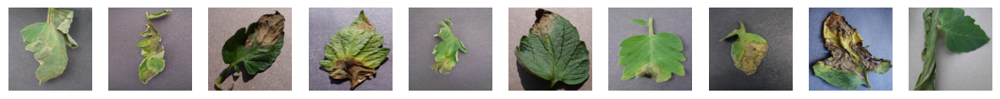

Tomato___Leaf_Mold


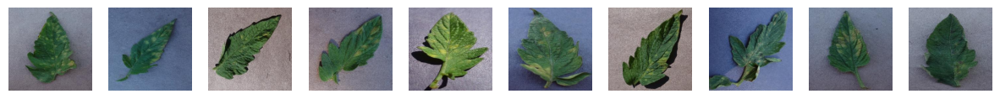

Tomato___Septoria_leaf_spot


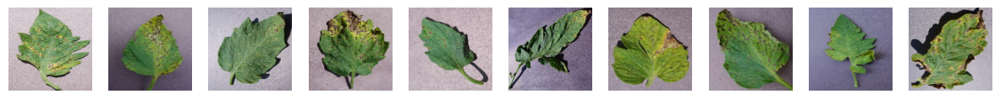

Tomato___Spider_mites Two-spotted_spider_mite


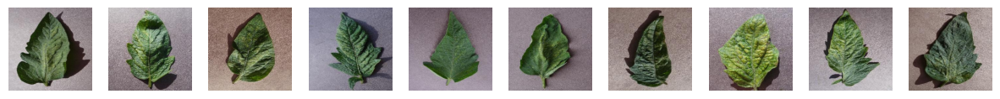

Tomato___Target_Spot


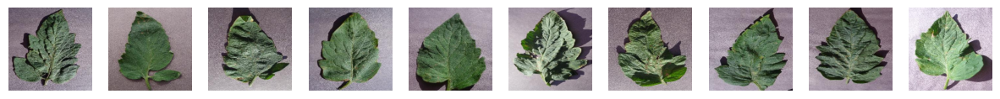

Tomato___Tomato_Yellow_Leaf_Curl_Virus


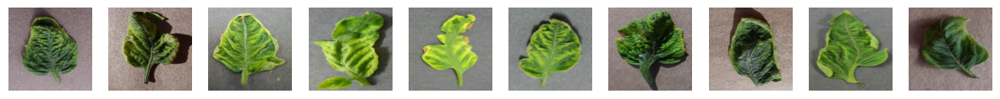

Tomato___Tomato_mosaic_virus


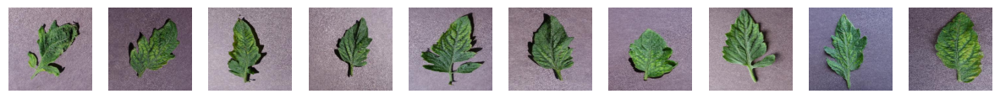

Tomato___healthy


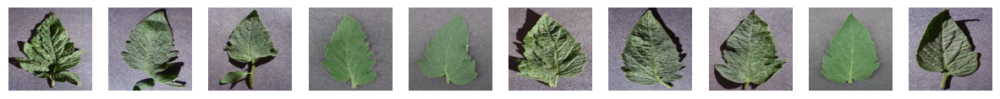

In [14]:
import random
from torchvision.transforms import v2           # usamos v2 porque es más rápido y presenta más capacidades

# Create a dictionary to store the image tensors by folder
img_data = {}
for img_path, label in dataset_color.samples:
    folder_name = dataset_color.classes[label]  # Gets the folder name from the dataset
    if folder_name not in img_data:
        img_data[folder_name] = []
    img_data[folder_name].append(img_path)

# Define the transformation
ToTensor_transform = v2.Compose([                   # Replace v1.ToTensor(): Convert images to tensor between [0,1] 
    v2.ToImage(),                                   
    v2.ToDtype(torch.float32, scale=True),                      
])

# Sample and display images
for i, folder in enumerate(img_data.keys()):
    print(folder)
    sample_size = 10
    # Ensure there are enough images in the folder
    if len(img_data[folder]) < sample_size:
        print(f"Not enough images in folder '{folder}' for sampling.")
        continue

    # Randomly sample image paths and apply transformations
    sampled_images = random.sample(img_data[folder], sample_size)
    
    # Note: This part still uses Image for loading but can be replaced depending on the available format
    tensors = [ToTensor_transform(datasets.folder.default_loader(path)) for path in sampled_images]

    # Create a grid of images
    plt.figure(figsize=(15, 5))
    for index, img_tensor in enumerate(tensors):
        plt.subplot(1, sample_size, index + 1)  # Create a subplot for each image
        plt.imshow(img_tensor.permute(1, 2, 0))  # Change tensor shape from (C, H, W) to (H, W, C)
        plt.axis('off')  # Hide axes

    plt.show()  # Display the images

**OBSERVACIONES:**

- En general, las que tienen una condición "Healthy", vemos que predomina enteramente el color verde, mientras que en los casos con enfermedad, se observan manchas o diferentes tonalidades (p.ej., amarillo). Con este criterio, vemos que considerar la imagen a color puede ser relevante para disernir el estado.

- Otro parámetro que se observa es que en las plantas enfermas, se observan "huecos". Alguna técnica de segmentación de bordes (p.ej., Canny) podría usarse para facilitar la clasificación.

Agrupemos en 2 casos macro: Healthy / Disease:

In [15]:
# Find the indices of classes that match '___healthy' and those that don't
healthy_indices = [i for i, cls in enumerate(class_names) if '___healthy' in cls]
diseased_indices = [i for i, cls in enumerate(class_names) if '___healthy' not in cls]

# Count total images per class
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Sum counts for 'healthy' classes
healthy_total = sum(class_counts.get(idx, 0) for idx in healthy_indices)
# Sum counts for 'other' classes
diseased_total = sum(class_counts.get(idx, 0) for idx in diseased_indices)

print(f"Images labeled as 'healthy': {healthy_total}")
print(f"Images labeled as 'diseased': {diseased_total}")
print(f"Ratio 'healthy/diseased': {(healthy_total/diseased_total):.2f}")

Images labeled as 'healthy': 15084
Images labeled as 'diseased': 39221
Ratio 'healthy/diseased': 0.38


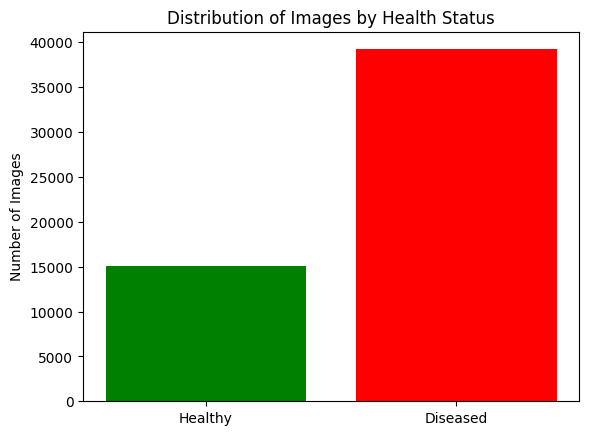

In [16]:
# Data for the bar chart
labels = ['Healthy', 'Diseased']
counts = [healthy_total, diseased_total]

# Create a bar plot with specified colors
plt.bar(labels, counts, color=['green', 'red'])

# Add labels and title
plt.ylabel('Number of Images')
plt.title('Distribution of Images by Health Status')

# Display the plot
plt.show()

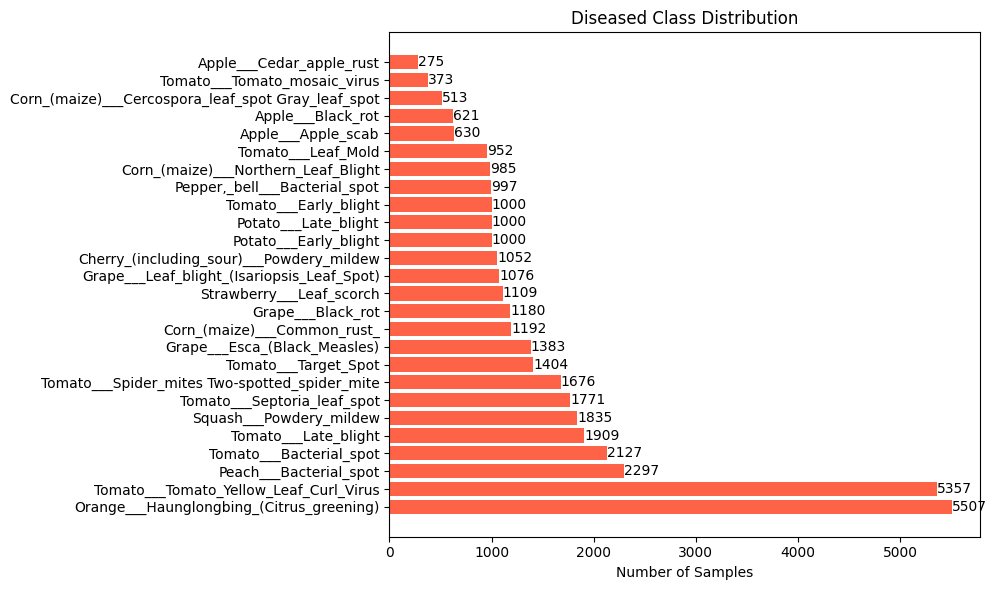

In [17]:
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Filter only diseased classes
diseased_class_counts = {
    class_names[cls]: count
    for cls, count in class_counts.items()
    if '___healthy' not in class_names[cls]
}

# Sort by count (optional)
diseased_class_counts = dict(sorted(diseased_class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot
plt.figure(figsize=(10, 6))
bars = plt.barh(list(diseased_class_counts.keys()), list(diseased_class_counts.values()), color='tomato')
plt.xlabel('Number of Samples')
for bar in bars:
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, str(width), va='center')
plt.title('Diseased Class Distribution')
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Como podemos ver hay algunos casos de enfermedades en los que se cuenta con pocos datos, es posible que para esto se tenga que generar algunas muestras, o la precision del modelo sea peor. 

Veamos ahora la clasificación binaria, pero por especie de planta.

In [18]:
# Obtenemos las especies del dataset:
plant_species = list(set(cls.split('___')[0] for cls in class_names))
plant_species

['Corn_(maize)',
 'Raspberry',
 'Tomato',
 'Cherry_(including_sour)',
 'Potato',
 'Strawberry',
 'Apple',
 'Blueberry',
 'Orange',
 'Pepper,_bell',
 'Peach',
 'Squash',
 'Grape',
 'Soybean']

In [19]:
n_species = len(plant_species)
print("Amount of plant species in the dataset: ", n_species)

Amount of plant species in the dataset:  14


In [20]:

# Count the number of samples per class index in your dataset
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# List the class indices that correspond to 'healthy' classes
healthy_indices = [i for i, cls in enumerate(class_names) if '___healthy' in cls]

# List the class indices that do NOT correspond to 'healthy' classes (i.e., diseased)
diseased_indices = [i for i, cls in enumerate(class_names) if '___healthy' not in cls]

# Initialize a list to store data for each plant species
data = []

# Calculate the total number of samples in the dataset
total_samples = sum(class_counts.values())

# Loop over each plant species
for sp in plant_species:
    # Find all class indices corresponding to this species
    class_idx_for_sp = [i for i, name in enumerate(class_names) if name.startswith(sp + '___')]
    
    # Sum of healthy class counts for this species
    healthy_total = sum(class_counts.get(idx, 0) for idx in class_idx_for_sp if idx in healthy_indices)
    
    # Sum of diseased class counts for this species
    diseased_total = sum(class_counts.get(idx, 0) for idx in class_idx_for_sp if idx in diseased_indices)
    
    # Total samples for this species
    total_especie = healthy_total + diseased_total
    
    # Fraction of total dataset
    frac = total_especie / total_samples if total_samples > 0 else 0
    
    # Fraction of healthy and diseased within that species
    healthy_fraction_species = healthy_total / total_especie if total_especie > 0 else 0
    diseased_fraction_species = diseased_total / total_especie if total_especie > 0 else 0

    # Append data with all info
    data.append({
        'plant_species': sp,
        'n_instances': total_especie,
        'fraction': frac,
        'healthy_count': healthy_total,
        'diseased_count': diseased_total,
        'healthy_fraction_in_species': healthy_fraction_species,
        'diseased_fraction_in_species': diseased_fraction_species
    })

# Convert to DataFrame
df = pd.DataFrame(data)
df = pd.DataFrame(data).set_index('plant_species')

# Mostrar la tabla
print(df)

                         n_instances  fraction  healthy_count  diseased_count  \
plant_species                                                                   
Corn_(maize)                    3852  0.070933           1162            2690   
Raspberry                        371  0.006832            371               0   
Tomato                         18160  0.334408           1591           16569   
Cherry_(including_sour)         1906  0.035098            854            1052   
Potato                          2152  0.039628            152            2000   
Strawberry                      1565  0.028819            456            1109   
Apple                           3171  0.058392           1645            1526   
Blueberry                       1502  0.027659           1502               0   
Orange                          5507  0.101409              0            5507   
Pepper,_bell                    2475  0.045576           1478             997   
Peach                       

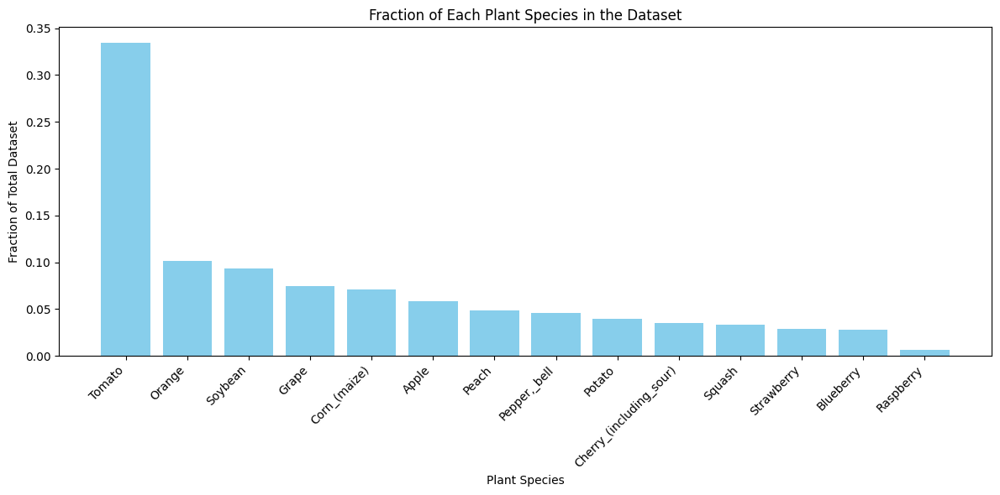

In [21]:
import matplotlib.pyplot as plt

# Ordenar el DataFrame por 'fraction' si quieres
df_sorted = df.sort_values(by='fraction', ascending=False)

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df_sorted.index, df_sorted['fraction'], color='skyblue')

# Añadir etiquetas y título
plt.xlabel('Plant Species')
plt.ylabel('Fraction of Total Dataset')
plt.title('Fraction of Each Plant Species in the Dataset')
plt.xticks(rotation=45, ha='right')  # rotar etiquetas para mejor visibilidad

# Mostrar la gráfica
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Se observa una preponderancia marcada de la especie Tomate en el dataset, superando en 3 veces al inmediato siguiente.

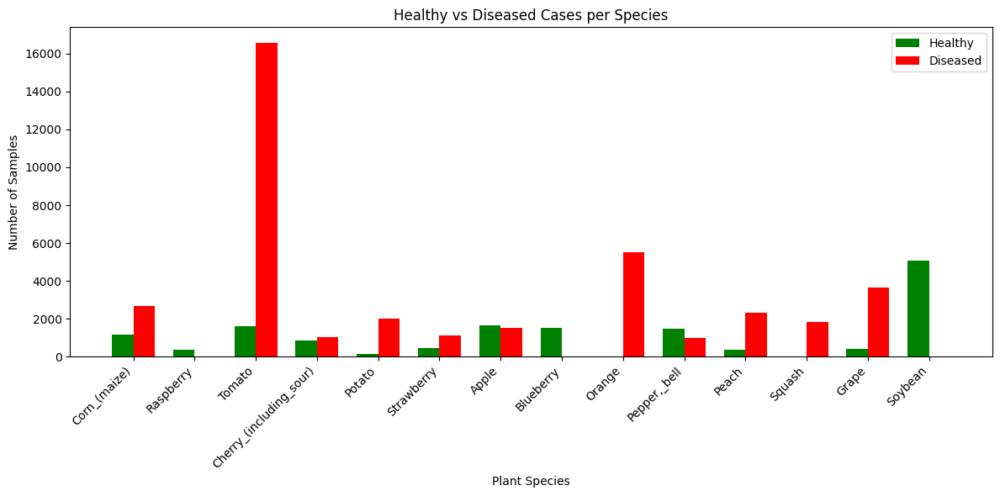

In [22]:
# Extract data from the DataFrame
species = df.index
healthy_counts = df['healthy_count']
diseased_counts = df['diseased_count']

# Positions for the grouped bars
x = np.arange(n_species)
width = 0.35  # Width of each bar

# Create the plot
fig, ax = plt.subplots(figsize=(12, 6))

# Plot 'Healthy' counts
ax.bar(x - width/2, healthy_counts, width, label='Healthy', color='green')

# Plot 'Diseased' counts
ax.bar(x + width/2, diseased_counts, width, label='Diseased', color='red')

# Add labels and title
ax.set_xlabel('Plant Species')
ax.set_ylabel('Number of Samples')
ax.set_title('Healthy vs Diseased Cases per Species')

# Set x-ticks to correspond to species names
ax.set_xticks(x)
ax.set_xticklabels(species, rotation=45, ha='right')

# Add a legend
ax.legend()

# Adjust layout to prevent overlap and display the plot
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- En la mayoría de las especies se observa el desbalance de clase, con excepción de las manzanas, cereza y ají donde las clases estan relativamente balanceadas.

- Se deduce que gran parte del desbalanceo del set es atribuida a la especie tomate.

In [23]:
print('Healthy cases without Tomato: ', counts[0] - df.loc['Tomato', 'healthy_count'])
print('Diseased cases without Tomato: ', counts[1] - df.loc['Tomato', 'diseased_count'])

Healthy cases without Tomato:  13493
Diseased cases without Tomato:  22652


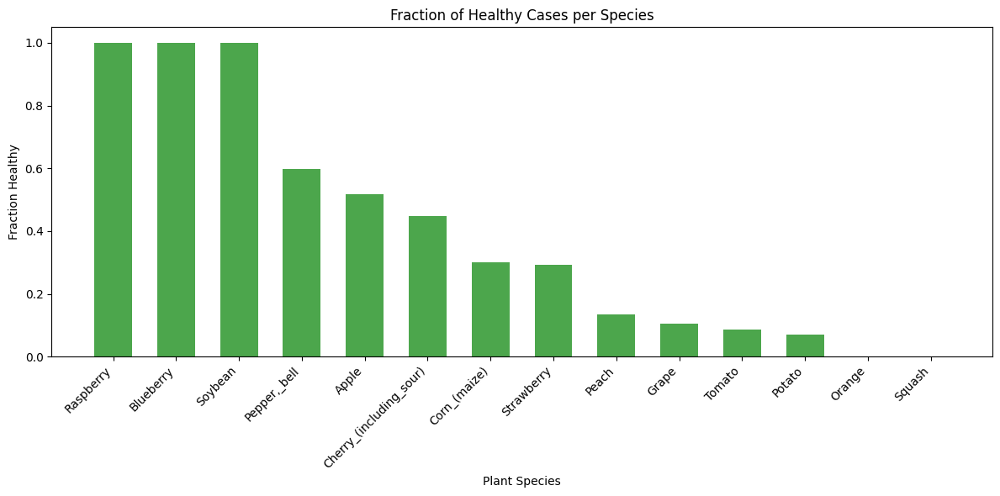

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# Extract columns
species = df.index
healthy_fractions = df['healthy_fraction_in_species']

# Create a DataFrame for sorting
df_sorted = pd.DataFrame({
    'species': species,
    'healthy_fraction': healthy_fractions
})

# Sort by healthy_fraction in descending order
df_sorted = df_sorted.sort_values(by='healthy_fraction', ascending=False)

# Prepare data for plotting
sorted_species = df_sorted['species']
sorted_fractions = df_sorted['healthy_fraction']
x = np.arange(len(sorted_species))
width = 0.6

# Plot
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(x, sorted_fractions, width, color='green', alpha=0.7)

# Set labels and title
ax.set_xlabel('Plant Species')
ax.set_ylabel('Fraction Healthy')
ax.set_title('Fraction of Healthy Cases per Species')
ax.set_xticks(x)
ax.set_xticklabels(sorted_species, rotation=45, ha='right')

plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Vemos que hay 3 especies donde directamente el 100% los casos son "healthy".

- Por el contrario, hay 2 especies donde el 100% de los casos son con patologías.

Analizamos los histogramas de los canales.

In [25]:
def get_mean_channels(indices, dataset, num_images=100):
    r_means = []
    g_means = []
    b_means = []
    count = 0
    for sample in dataset.samples:
        label_idx = sample[1]
        if label_idx in indices:
            # cargar imagen
            image = dataset.loader(sample[0])
            if image is not None:
                img_array = np.array(image)
                # Asumiendo formato [H,W,C]
                r_mean = np.mean(img_array[:,:,0])
                g_mean = np.mean(img_array[:,:,1])
                b_mean = np.mean(img_array[:,:,2])
                r_means.append(r_mean)
                g_means.append(g_mean)
                b_means.append(b_mean)
                count += 1
                if count >= num_images:
                    break
    return r_means, g_means, b_means

Tomamos el dataset segmentado para independizarnos del fondo (valor 0).

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Get average channel values for 'healthy' cases
healthy_r, healthy_g, healthy_b = get_mean_channels(healthy_indices, dataset_seg)

# Get channels average values for 'diseased' cases
diseased_r, diseased_g, diseased_b = get_mean_channels(diseased_indices, dataset_seg)

# Plot histograms
fig = make_subplots(rows=3, cols=2, subplot_titles=(
    "Healthy", "Diseased",
))
def add_distplot(fig, data, row, col, color):
    dist = go.Histogram(
        x=data,
        nbinsx=20,
        marker_color=color,
        opacity=0.75,
        showlegend=False
    )
    fig.add_trace(dist, row=row, col=col)

# Agregar los gráficos a la figura
add_distplot(fig, healthy_r, 1, 1, 'red')
add_distplot(fig, diseased_r, 1, 2, 'darkred')
add_distplot(fig, healthy_g, 2, 1, 'green')
add_distplot(fig, diseased_g, 2, 2, 'darkgreen')
add_distplot(fig, healthy_b, 3, 1, 'blue')
add_distplot(fig, diseased_b, 3, 2, 'darkblue')

x_range_row1 = [min(healthy_r + diseased_r), max(healthy_r + diseased_r)]
x_range_row2 = [min(healthy_g + diseased_g), max(healthy_g + diseased_g)]
x_range_row3 = [min(healthy_b + diseased_b), max(healthy_b + diseased_b)]

fig.update_xaxes(range=x_range_row1, row=1, col=1)
fig.update_xaxes(range=x_range_row1, row=1, col=2)

fig.update_xaxes(range=x_range_row2, row=2, col=1)
fig.update_xaxes(range=x_range_row2, row=2, col=2)

fig.update_xaxes(range=x_range_row3, row=3, col=1)
fig.update_xaxes(range=x_range_row3, row=3, col=2)

# Show
fig.update_layout(
    height=900,
    width=1000,
    title_text="Distribution of Average Channel Values (Healthy vs Diseased)",
    template="simple_white"
)
fig.show()

**OBSERVACIONES:**

- Para los casos "healthy", las distribuciones de los 3 canales siguen una distribución gaussiana.

-  Se observa un leve aumento de la importancia del canal rojo en los casos "diseased". Esto es congruente con el hecho de que plantas con patologías presentan colores rojos/amarillentos.

In [27]:
fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=("Healthy", "Diseased"),
    shared_yaxes=True
)

# Listas de valores y nombres de canales
healthy_values = [healthy_r, healthy_g, healthy_b]
diseased_values = [diseased_r, diseased_g, diseased_b]
colors = ['Red', 'Green', 'Blue']

# Añadimos boxplots para "healthy"
for idx, values in enumerate(healthy_values):
    fig.add_trace(
        go.Box(
            y=values,
            name=colors[idx],
            boxpoints='outliers',
            marker=dict(color=colors[idx].lower()),
            showlegend=False  # Para que no dupliquen la leyenda
        ),
        row=1,
        col=1
    )

# Añadimos boxplots para "diseased"
for idx, values in enumerate(diseased_values):
    fig.add_trace(
        go.Box(
            y=values,
            name=colors[idx],
            boxpoints='outliers',
            marker=dict(color=colors[idx].lower()),
            showlegend=False
        ),
        row=1,
        col=2
    )

# Actualizar el layout
fig.update_layout(
    height=400,
    width=900,
    yaxis_title="Mean value",
    boxmode='group',
    title_text="Mean value vs. Color channel (Healthy vs. Diseased)"
)

fig.show()

**OBSERVACIONES:**

- Se ve una mayor predominancia del verde, como era de esperarse por tratarse de hojas, seguido por el rojo y el azul, respectivamente.

Aprovechamos el dataset versión segmentada y evaluamos el tamaño de la hoja en relación a la imagen total. Por cada especie, vemos el caso sano versus el caso con patología.

In [28]:
import matplotlib.pyplot as plt
from torchvision.transforms import v2 as v2_transforms
from collections import defaultdict

in_width = 256
in_height = 256

# Define the transformation
to_tensor_transform = v2_transforms.Compose([
    v2_transforms.ToImage(),
    v2_transforms.ToDtype(torch.float32, scale=True),
])

# Define transformations
grayscale_transform = v2_transforms.Compose([
    v2_transforms.Resize((in_width, in_height)),
    to_tensor_transform,
    v2_transforms.Grayscale(num_output_channels=1),
])

# Dictionary for storing values 2 groups: healthy and non-healthy
species_groups = defaultdict(lambda: {'healthy': [], 'diseased': []})

for img, label in dataset_seg:
    # Convert image to grayscale tensor
    img_gray_tensor = grayscale_transform(img)
    
    # Get dimensions
    _, H, W = img_gray_tensor.shape
    
    # Count zero pixels
    zero_pixels = (img_gray_tensor == 0).sum().item()
    total_pixels = H * W
    
    # Compute value
    value = 1 - (zero_pixels / total_pixels)
    
    # Extract species name
    class_name_full = dataset_seg.classes[label]
    species_name = class_name_full.split("___")[0]
    
    # Group based on "healthy" or not
    if class_name_full.endswith("___healthy"):
        species_groups[species_name]['healthy'].append(value)
    else:
        species_groups[species_name]['diseased'].append(value)


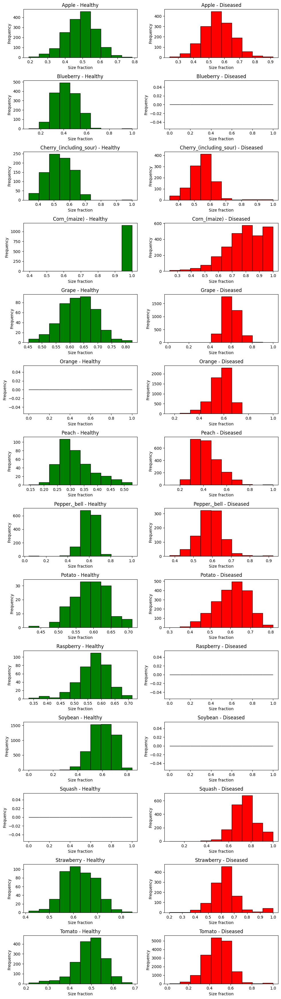

In [29]:
# Plot
fig, axes = plt.subplots(nrows=n_species, ncols=2, figsize=(10, 2.5*n_species))
if n_species == 1:
    axes = [axes]  # Make axes iterable if only one class

for i, (species, groups) in enumerate(species_groups.items()):
    # Healthy in green
    axes[i][0].hist(groups['healthy'], bins=10, edgecolor='black', color='green')
    axes[i][0].set_title(f"{species} - Healthy")
    axes[i][0].set_xlabel('Size fraction')
    axes[i][0].set_ylabel('Frequency')
    
    # Diseased in red
    axes[i][1].hist(groups['diseased'], bins=10, edgecolor='black', color='red')
    axes[i][1].set_title(f"{species} - Diseased")
    axes[i][1].set_xlabel('Size fraction')
    axes[i][1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

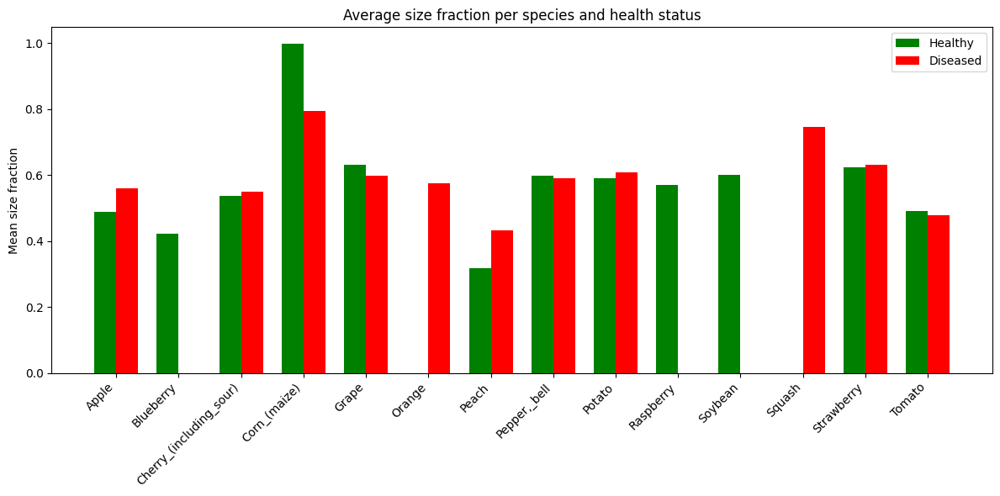

In [30]:
# Prepare lists to store species names and their mean values
species_list = []
healthy_means = []
non_healthy_means = []

# Calculate mean values for each species and group
for species, groups in species_groups.items():
    species_list.append(species)
    # Compute mean for healthy samples, default to 0 if empty
    healthy_means.append(np.mean(groups['healthy']) if groups['healthy'] else 0)
    # Compute mean for diseased samples, default to 0 if empty
    non_healthy_means.append(np.mean(groups['diseased']) if groups['diseased'] else 0)

# Set positions for the bars
x = np.arange(len(species_list))
width = 0.35  # Width of the bars

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Plot bars for healthy and diseased means side by side
ax.bar(x - width/2, healthy_means, width, label='Healthy', color='green')
ax.bar(x + width/2, non_healthy_means, width, label='Diseased', color='red')

# Add labels, title, and xticks
ax.set_xticks(x)
ax.set_xticklabels(species_list, rotation=45, ha='right')
ax.set_ylabel('Mean size fraction')
ax.set_title('Average size fraction per species and health status')
ax.legend()

plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Se ve que mayorítariamente siguen una distribución normal los tamaños de hoja.

- No se observan diferencias de tamaño entre misma especie sana o enferma.

- El tamaño promedio de hoja de las especies esta alrededor del 50%, 60% de la imagen.

### 2. MODELLING

#### 2.1 DATASET COMPOSITION

Generamos un dataset con una mezcla aleatoria de las versiones ('color', 'grayscale', 'segmented'), donde para cada instancia, seleccionamos aleatoriamente de cada uno de los 3 datasets. Al mismo tiempo que mantenemos constante el tamaño del dataset (es decir, consumimos menos recursos computacionales), esperamos que el modelo generalize mejor con esta estrategia.

Posteriormente, Convertimos el problema a clasificación binaria donde las opciones son si la planta esta sana ('Healthy') o presenta patología ('Diseased').

In [31]:
from torch.utils.data import Dataset

class TransformDataset(Dataset):
    def __init__(self, datasets_list, seed=42, transform=None,
                 species_mapping=None, health_mapping=None):
        self.datasets = datasets_list
        self.length = len(self.datasets[0])  # Assume all datasets have same length
        self.seed = seed
        self.transform = transform
        self.species_mapping = species_mapping
        self.health_mapping = health_mapping

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        import random
        random.seed(self.seed + idx)
        chosen_dataset = random.choice(self.datasets)
        image, label_idx = chosen_dataset[idx]
        # Apply transformation if exists
        if self.transform:
            image = self.transform(image)
        # Map label to species and health status
        class_name_full = chosen_dataset.classes[label_idx]
        # Extract species from class name
        species_name = class_name_full.split("___")[0]
        # Map to species ID if mapping provided
        species_id = self.species_mapping[species_name] if self.species_mapping else species_name
        # Map to health status ID
        health_id = self.health_mapping[class_name_full]
        # Return image and label dictionary
        return image, {"species": species_id, "health": health_id}

# Generate mappings for species and health status:
species_names = set([name.split("___")[0] for name in class_names])
species_mapping = {name: idx for idx, name in enumerate(sorted(species_names))}

# For health status
health_mapping = {
    class_name: 0 if '__healthy' in class_name else 1
    for class_name in class_names
}

# Crear tu nuevo dataset con etiquetas convertidas
rnd_seed = 42
dataset = TransformDataset([dataset_color, dataset_gray, dataset_seg], 
                           seed=rnd_seed,
                           transform=ToTensor_transform,
                           species_mapping=species_mapping,
                           health_mapping=health_mapping)

ndata = len(dataset)

#### 2.2 TRAIN, VALIDATION & TEST SPLIT

In [32]:
# Definimos fracciones para train/validation/test
val_size = 0.20
test_size = 0.20

# Calculamos la cantidad de elementos de cada set
nval = int(val_size * ndata)
ntest = int(test_size * ndata)
ntrain = ndata - (nval + ntest)

# Generamos los sets
generator = torch.Generator().manual_seed(rnd_seed)
train_data, val_data, test_data = torch.utils.data.random_split(dataset, [ntrain, nval, ntest], generator = generator)

print("Dimension del set de train:", ntrain)
print("Dimension del set de validation:", nval)
print("Dimension del set de test:", ntest)
print("")
print(f"Fracción de datos de train: {1 - (val_size + test_size):.2f}")
print(f"Fracción de datos de validation: {val_size:.2f}")
print(f"Fracción de datos de test: {test_size:.2f}")

Dimension del set de train: 32583
Dimension del set de validation: 10861
Dimension del set de test: 10861

Fracción de datos de train: 0.60
Fracción de datos de validation: 0.20
Fracción de datos de test: 0.20


In [33]:
def get_set_normalize_params(dataset, batch_size=64, seed=42):

    # get a random sample
    random.seed(seed)
    sample_indices = random.sample(range(len(dataset)), batch_size)
    
    all_pixels = []

    for idx in sample_indices:
        img, _ = dataset[idx]
        img = ToTensor_transform(img)
        all_pixels.append(img.reshape(-1))
    
    # Concatenar los píxeles del batch
    all_pixels_tensor = torch.cat(all_pixels)

    # Calcular media y std
    mean = all_pixels_tensor.mean().item()
    std = all_pixels_tensor.std().item()

    print(f'Media: {mean:.2g}')
    print(f'Desviación estándar: {std:.2g}')

    return mean, std

# Cargar el conjunto de entrenamiento sin aplicar transform (para calculo de mean y std)
# Consideramos diferentes batchs
mean_std = []
batch_list = [64, 128, 256, 512]
for bsize in batch_list:
    print(f'Batch size: {bsize}')
    mean_std.append(get_set_normalize_params(train_data, batch_size = bsize))
    print("")

# Recover las value
mean = mean_std[-1][0]
std = mean_std[-1][1]

Batch size: 64
Media: 0.4
Desviación estándar: 0.24

Batch size: 128
Media: 0.39
Desviación estándar: 0.24

Batch size: 256
Media: 0.38
Desviación estándar: 0.25

Batch size: 512
Media: 0.38
Desviación estándar: 0.24



Vemos que considerando un batch de 256 casos, ya se converge a un valor de media y desvío estándar.

In [34]:
# Definir transformaciones
# Transformación a todas las imagenes
transform = v2.Compose([
    v2.Resize((in_width, in_height)),                           # Resize images (just in case)
    ToTensor_transform,                                         # Convert to Tensor
    v2.Normalize(mean=[mean], std=[std]),                       # Normalize channel
    ])

#### 2.3 DATA AUGMENTATION

Para hacer *data augmentation*, como primer aproximación, aprovechamos la funcionalidad *transforms*. En particular, aplicamos la técnica *RandAument*.

Este método necesita que se le especifiquen 2 parámetros: 

- N:    Número transformaciones a aplicar secuencialmente.
- M:    Magnitud de todas las transformaciones. Valor entre [1, 10], donde 10 indica la máxima escala para una transformación dada.

Se pueden aplicar 14 tipos de transformaciones disponibles:

- identity
- rotate 
- posterize
- sharpness
- translate-x
- autoContrast
- solarize 
- contrast 
- shear-x 
- translate-y 
- equalize 
- color 
- brightness
- shear-y

Más precisiones se pueden encontrar en Cubuk et. al. (2019),"RandAugment: Practical automated data augmentation with a reduced search space", 	arXiv:1909.13719, https://doi.org/10.48550/arXiv.1909.13719.

In [35]:
# Transformación para data augmentation
N = 3
M = 4
data_aug_transforms = v2.Compose([
                        v2.RandAugment(num_ops=N, magnitude=M),
                        ToTensor_transform
    ])

#### 2.4 DATA LOADER

In [36]:
batch_size = 32

# Cargamos los sets
train_loader = torch.utils.data.DataLoader(train_data, batch_size = batch_size, shuffle = True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size = batch_size, shuffle = False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = batch_size, shuffle = False)

In [37]:
for images, labels in train_loader:
    print(images.shape)  # Imprime la forma de las imágenes
    print(labels)        # Imprime las etiquetas (números enteros codificados)
    break  # Salir después del primer lote

torch.Size([32, 3, 256, 256])
{'species': tensor([ 3,  3, 13, 13,  4, 13,  7, 10, 10,  8, 10, 11, 10, 13, 13, 10,  2,  5,
         9,  5, 13,  0, 13, 13,  1, 13,  6,  0,  3, 13,  7,  6]), 'health': tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1,
        0, 1, 1, 0, 1, 1, 0, 1])}


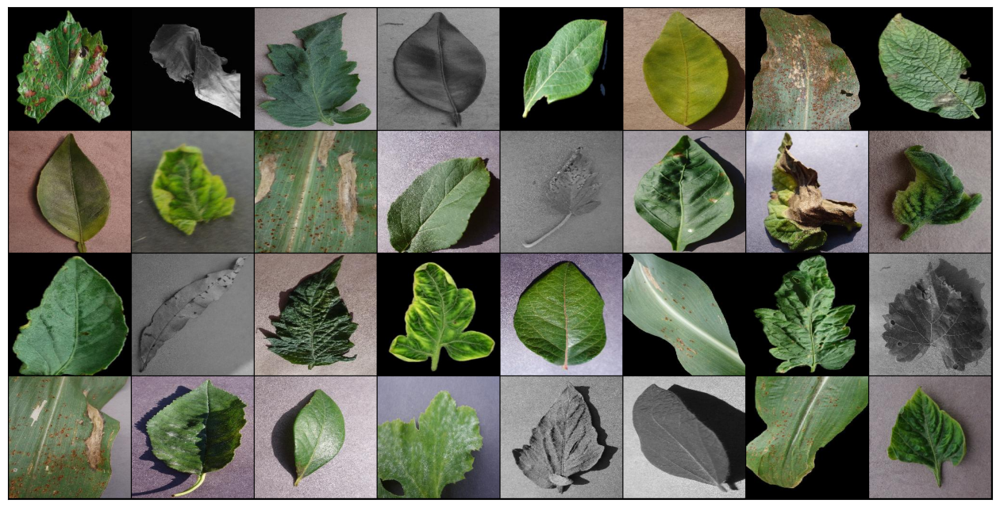

In [38]:
from torchvision.utils import make_grid

def show_batch(dl):
    """Plot images grid of single batch"""
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=8).permute(1,2,0))
        break
        
show_batch(train_loader)

#### 2.5 BASELINE MODEL

Como primer modelo baseline, aplicamos una CNN simple.

##### 2.5.1 Model definition

Primeramente, configuramos el *device* acorde a los disponible:

In [39]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

Definimos una clase base con funcionalidades orientadas a entrenar el modelo, validarlo y obtener los resultados por epoch.

In [44]:
import torch.nn as nn
from torch import stack
import torch.nn.functional as F

from sklearn.metrics import accuracy_score, f1_score

class ImageClassificationBase(nn.Module):
        
    def training_step(self, batch):
        images, labels = batch
        images = images.to(device)                                      # Send to device
        labels = {k: v.to(device) for k, v in labels.items()}           # Send to device

        outputs = self(images)                      # Generate predictions

        label_keys = list(labels.keys())
        loss = 0 
        for out, key in zip(outputs, label_keys):
            loss += F.cross_entropy(out, labels[key])
            
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        images = images.to(device)                                      # Send to device
        labels = {k: v.to(device) for k, v in labels.items()}           # Send to device

        outputs = self(images)          # Generate predictions

        results = {}
        label_keys = list(labels.keys())

        for out, key in zip(outputs, label_keys):
            true_labels = labels[key]
            
            # Calcula la pérdida para cada salida
            loss = F.cross_entropy(out, true_labels)
            results[f'val_loss_{key}'] = loss.detach()

            # Predicciones
            _, preds = torch.max(out, dim=1)
            preds_np = preds.cpu().numpy()
            true_labels_np = true_labels.cpu().numpy()

            # Métricas
            acc = accuracy_score(true_labels_np, preds_np)                    # Calculate accuracy
            f1 = f1_score(true_labels_np, preds_np, average='weighted')       # Calculate f1-score

            results[f'val_acc_{key}'] = torch.tensor(acc)
            results[f'val_f1_{key}'] = torch.tensor(f1)

        return results
    
    def validation_epoch_end(self, outputs):
        metrics = {}
        # Reunir todas los claves posibles de las salidas
        all_keys = set()
        for output in outputs:
            all_keys.update(output.keys())

        # Para cada clave, calcular la media
        for key in all_keys:
            values = [x[key] for x in outputs if key in x]
            mean_value = stack(values).mean()
            metrics[key] = mean_value.item()
            
        return metrics
    
    def epoch_end(self, epoch, result):
        # Construir la línea de impresión
        msg = f"Epoch [{epoch+1}]"
        for key, value in result.items():
            msg += f", {key}: {value:.4f}"
        print(msg)

In [46]:
# Bloque de convolución para emplear en mi red
def conv_block(c_in, c_out, activation = nn.ReLU(), k=3, p='same', s=1, pk=2):
    return nn.Sequential(                                   # el módulo Sequential se engarga de hacer el forward de todo lo que tiene dentro.
        nn.Conv2d(c_in, c_out, k, padding=p, stride=s),     # conv
        activation,                                         # activation
        nn.MaxPool2d(pk)                                    # pooling
    )

# Función auxiliar para calcular la dimensión de salida de la red convolucional
def calculate_output_dimensions(input_height, 
                                input_width, 
                                n_conv_layers, 
                                kernel_size, 
                                padding_type, 
                                stride, 
                                pooling_kernel_size):
    heights = []
    widths = []

    if padding_type == 'valid':
        padding = 0
    elif padding_type == 'same':
        padding = kernel_size // 2
    elif padding_type == 'full':
        padding = kernel_size - 1

    current_height = input_height
    current_width = input_width

    for _ in range(n_conv_layers):
        # Calcula la salida de la capa convolucional
        current_height = (current_height + 2 * padding - kernel_size) // stride + 1
        current_width = (current_width + 2 * padding - kernel_size) // stride + 1

        # Aplica el max pooling
        current_height = (current_height - pooling_kernel_size) // pooling_kernel_size + 1
        current_width = (current_width - pooling_kernel_size) // pooling_kernel_size + 1

        # Guarda la altura y el ancho después de cada capa
        heights.append(current_height)      # Guarda la altura
        widths.append(current_width)        # Guarda el ancho

    return heights, widths

Defino ahora mi CNN tomando como base la clase "ImageClassificationBase" definida previamente.

In [53]:
class CNN_plant_disease_classification(ImageClassificationBase):
    def __init__(self, 
                 inputs_by_conv_layer = [1, 32],    # Capas convolucionales
                 inputs_by_hidden_layer = [],       # Capas ocultas
                 n_species = n_species,             # Número de clases para especie
                 n_healthy = 2,                     # Número de clases para estado de salud (binario)
                 kernel = 3,
                 padding = 'same',
                 stride = 1,
                 poolingk = 2,
                 in_height = None,
                 in_width = None,
                 info = True):
        super().__init__()

        # -----------------------------------------------------
        # ACTIVATION FUNCTION
        # -----------------------------------------------------

        self.activation = nn.ReLU()

        # -----------------------------------------------------
        # CONVOLUTIONAL LAYERS
        # -----------------------------------------------------

        self.kernel = kernel
        self.padding = padding
        self.stride = stride
        self.poolingk = poolingk

        self.conv = nn.ModuleList()
        self.n_conv_layers = len(inputs_by_conv_layer) - 1

        for i in range(self.n_conv_layers):
            self.conv.append(conv_block(inputs_by_conv_layer[i], 
                                        inputs_by_conv_layer[i+1], 
                                        activation = self.activation, 
                                        k=self.kernel, 
                                        p=self.padding, 
                                        s=self.stride,
                                        pk=self.poolingk))
            
        conv_heights, conv_width = calculate_output_dimensions(in_height, 
                                                                in_width,
                                                                self.n_conv_layers, 
                                                                self.kernel, 
                                                                self.padding, 
                                                                self.stride, 
                                                                self.poolingk)  

        # -----------------------------------------------------
        # FULLY CONNECTED HIDDEN LAYERS
        # -----------------------------------------------------

        self.lin = nn.ModuleList()
        
        conv_out_height = conv_heights[-1]  # Altura de salida de la última capa convolucional
        conv_out_width = conv_width[-1]     # Ancho de salida de la última capa convolucional
        inputs_by_lin_layer = [int(inputs_by_conv_layer[-1]*conv_out_height*conv_out_width)]
        inputs_by_lin_layer.extend(inputs_by_hidden_layer)

        self.n_lin_layers = len(inputs_by_lin_layer) - 1
        for i in range(self.n_lin_layers):
            self.lin.append(nn.Linear(inputs_by_lin_layer[i], inputs_by_lin_layer[i + 1]))
        
        # -----------------------------------------------------
        # OUTPUT LAYERS
        # -----------------------------------------------------

        self.output_especie = nn.Linear(inputs_by_lin_layer[-1], n_species)
        self.output_salud = nn.Linear(inputs_by_lin_layer[-1], n_healthy)

        if info:
            print('Neural Network successfully built')
            print('Architecture:')
            print(' ')        
            print(self)
            print(' ')        
            print('Número total de capas de Convolucionales: ', self.n_conv_layers)
            print('Número total de capas de Fully Connected: ', self.n_lin_layers+1)
            print('Número total de capas : ', self.n_conv_layers + self.n_lin_layers + 1)
        
        # Total de parámetros
        pytorch_total_params = sum(p.numel() for p in self.parameters() if p.requires_grad)
        print('Número total de parámetros a entrenar: ', pytorch_total_params)

    def forward(self, x):
        # Forward step
        # CONVOLUTIONAL LAYERS
        for i in range(self.n_conv_layers):
            x = self.conv[i](x)
        x = x.flatten(start_dim=1)
        # HIDDEN LAYERS
        for i in range(self.n_lin_layers):
            x = self.lin[i](x)
        # OUTPUT LAYER
        specie_logits = self.output_especie(x)
        healthy_logits = self.output_salud(x)
        return specie_logits, healthy_logits

In [55]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(model, dataloader_train, dataloader_val, epochs=30, patience=10, learning_rate=1e-4, opt_func=torch.optim.Adam):
    try:
        device
    except NameError:
        device = 'cpu'
    
    # Send model to device
    model.to(device)
    
    # Initialize early stopping parameters
    best_val_loss = float('inf')
    patience_counter = 0
    if patience is None:
        patience = epochs
    
    # List to store history
    history = []
    optimizer = opt_func(model.parameters(), learning_rate)
    
    for epoch in range(epochs):
        model.train()
        train_losses = []
        
        # Training loop
        for batch in dataloader_train:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
        # Validation/Evaluation step
        result = evaluate(model, dataloader_val)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        # Log epoch results
        model.epoch_end(epoch, result)
        # Append results to history
        history.append(result)
        
        # Early stopping based on validation loss
        current_val_loss = result.get('val_loss', None)  # Ensure this key exists in results
        if current_val_loss is not None:
            if current_val_loss < best_val_loss:
                best_val_loss = current_val_loss
                patience_counter = 0
            else:
                patience_counter += 1
        else:
            # If 'val_loss' not found, implement different logic or pass
            pass

        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs.")
            break
    
    return history

In [57]:
n_channels = 3
last_cout = 2
inputs_by_conv_layer = [n_channels, last_cout]

# Instanciamos la red
cnn_model = CNN_plant_disease_classification(inputs_by_conv_layer,
                    in_height = in_height,
                    in_width = in_width,
                    )

Neural Network successfully built
Architecture:
 
CNN_plant_disease_classification(
  (activation): ReLU()
  (conv): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 2, kernel_size=(3, 3), stride=(1, 1), padding=same)
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (lin): ModuleList()
  (output_especie): Linear(in_features=32768, out_features=14, bias=True)
  (output_salud): Linear(in_features=32768, out_features=2, bias=True)
)
 
Número total de capas de Convolucionales:  1
Número total de capas de Fully Connected:  1
Número total de capas :  2
Número total de parámetros a entrenar:  524360


In [59]:
import torchinfo as torchinfo

torchinfo.summary(cnn_model)

Layer (type:depth-idx)                   Param #
CNN_plant_disease_classification         --
├─ReLU: 1-1                              --
├─ModuleList: 1-2                        --
│    └─Sequential: 2-1                   --
│    │    └─Conv2d: 3-1                  56
│    │    └─ReLU: 3-2                    --
│    │    └─MaxPool2d: 3-3               --
├─ModuleList: 1-3                        --
├─Linear: 1-4                            458,766
├─Linear: 1-5                            65,538
Total params: 524,360
Trainable params: 524,360
Non-trainable params: 0

In [60]:
num_epochs = 30
patience = 10
lr=0.01
opt_func = torch.optim.Adam
# Fitting the model on training data and record the result after each epoch
history = fit(cnn_model, train_loader, val_loader, num_epochs, patience, lr, opt_func)  

Epoch [1], val_f1_species: 0.1734, val_loss_species: 2.2552, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f1_health: 0.6036, val_loss_health: 0.5952, train_loss: 3.0117
Epoch [2], val_f1_species: 0.1734, val_loss_species: 2.2544, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f1_health: 0.6036, val_loss_health: 0.5943, train_loss: 2.8392
Epoch [3], val_f1_species: 0.1734, val_loss_species: 2.2548, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f1_health: 0.6036, val_loss_health: 0.5947, train_loss: 2.8389
Epoch [4], val_f1_species: 0.1734, val_loss_species: 2.2550, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f1_health: 0.6036, val_loss_health: 0.5943, train_loss: 2.8389
Epoch [5], val_f1_species: 0.1734, val_loss_species: 2.2533, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f1_health: 0.6036, val_loss_health: 0.5970, train_loss: 2.8388
Epoch [6], val_f1_species: 0.1734, val_loss_species: 2.2551, val_acc_health: 0.7187, val_acc_species: 0.3340, val_f

KeyboardInterrupt: 

### 3 MÉTRICAS DE PERFOMANCE

#### 3.1 Predicciones sobre el Test set

#### 3.2 Confusión